<a href="https://colab.research.google.com/github/biplovebasel/Audio-Feature-Engineering/blob/main/audio_features.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Important References
1.Learning from Audio: Time Domain Features <a href='https://towardsdatascience.com/learning-from-audio-time-domain-features-4543f3bda34c'>[here]</a>

### IMPORTS

In [1]:
import os                                   # Used for accessing directories and other stuffs.
import IPython.display as ipd               # Used for playing the audio samples.
import librosa                              # Audio processing library(other useful ones are scipy,pydub,etc).
import librosa.display                      # Sometimes shows error so better import.
import matplotlib.pyplot as plt             # Plotting library(other useful one is seaborn).

### Download sample audio

In [2]:
!git clone https://github.com/biplovebasel/audio-samples- #cloning from repository on my github.

Cloning into 'audio-samples-'...
remote: Enumerating objects: 16, done.
remote: Counting objects: 100% (16/16), done.
remote: Compressing objects: 100% (15/15), done.
remote: Total 16 (delta 2), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (16/16), done.


### Get list of the audios
here we took 5 different types of audio samples

* a person speaking
* a passing car
* breaking of glass
* dog barking,and
*  music


In [3]:
path='audio-samples-/samples'               #path to the audio samples.
files=os.listdir(path)                      #list of all audio samples.
files                                       #displays the list.

['speech.wav',
 'glass_breaking.wav',
 'car_passing_by.wav',
 'dog_bark.wav',
 'dramatic_music.wav']

### Speech
Using `IPython.display.Audio` <a href='https://ipython.readthedocs.io/en/stable/api/generated/IPython.display.html'><small><small>[ref]<small></small></small></small></a> from `IPython` library to play the audio files. 

In [11]:
ipd.Audio(os.path.join(path,files[0]))

### Glass Breaking

In [12]:
ipd.Audio(os.path.join(path,files[1]))

### Car Passing

In [13]:
ipd.Audio(os.path.join(path,files[2]))

### Dog Barking

In [14]:
ipd.Audio(os.path.join(path,files[3]))

### Music

In [18]:
ipd.Audio(os.path.join(path,files[4]))               # file might not load since long.

### Loading all the Audio Signals using `librosa.load` <a href='https://librosa.org/doc/latest/generated/librosa.load.html'><small><small><small>[ref]</small></small></small></a>

In [5]:
speech,sr_speech    = librosa.load(path=os.path.join(path,files[0])) #writing 'path=' is optional.
glass,sr_glass      = librosa.load(os.path.join(path,files[1]))
car,sr_car          = librosa.load(os.path.join(path,files[2]))
dog,sr_dog          = librosa.load(os.path.join(path,files[3]))
music,sr_music      = librosa.load(os.path.join(path,files[4]))

# Time Domain Features

___1. Zero Crossing Rate:___
The zero crossing rate(ZRC) tells us about the rate at which the audio signal changes its sign.It is a significantly easy feature            to extract.For more intuition about ZRC check out this link:

<a href='https://medium.com/the-seekers-project/algorithmic-frequency-pitch-detection-series-part-1-making-a-simple-pitch-tracker-using-zero-9991327897a4'>Algorithmic frequency/pitch detection series - Part 1: Making a simple pitch tracker using Zero Crossing Rate.</a>

__Uses:__

* Identifying Percussion Sound
* Pitch Detection
* Voice Activity Detection

Feature extracted using `librosa.feature.zero_crossing_rate`   <a href='https://librosa.org/doc/latest/generated/librosa.feature.zero_crossing_rate.html'><small><small><small>[ref]</small></small></small></a>

In [27]:
zcr_speech   = librosa.feature.zero_crossing_rate(speech, frame_length=1024, hop_length=1024)
zcr_glass    = librosa.feature.zero_crossing_rate(glass, frame_length=1024, hop_length=1024)
zcr_car      = librosa.feature.zero_crossing_rate(car, frame_length=1024, hop_length=1024)
zcr_dog      = librosa.feature.zero_crossing_rate(dog, frame_length=1024, hop_length=1024)
zcr_music    = librosa.feature.zero_crossing_rate(music, frame_length=1024, hop_length=1024)

### Frame Length and Hop Length


 From the documentation we get:

__frame_length__ : int > 0 is the length of the frame over which to compute zero crossing rates.

__hop_length__ : int > 0 is the Number of samples to advance for each frame.

So frame length can be understood as window size in terms of ___number of samples of the discrete time signal___ and hop length is the ___number of samples to shift___ before selecting the window (frame).

***

### Selecting the frame length
As we can see we took frame length as 1024,What does this imply?
Sampling rate for sr_speech in 22050 i.e 22050 dicrete samples in 1 second.So seling frame length as 1024 we mean we are taking a frame of 22050/1024= 21.53ms long.

Is the a significance to the frame length?Yes.21 23 ms windows are good for getting valuable information from speech.Time windows are usually specific for specific kind of tasks.

***

### Selecting the Hop Length

Now the question is how to choose hop length? Since it just defines when the next frame starts we can choose anything right? The answer is both yes and no.If we choose and hop length which is small we are just adding redundancies to our data and if its too large we are lossing information.Therfore it is best practice to atleast keep hop length half of the frame length.

Why overlap you say?
The reason is overlapping helps to retain valuable information(in frequency domain) at the edge of the rectangular window which would be lost if not overlapped .For more information on this you can look up Windowing techniques .
Here since its zero crossing ovelapping just adds redundancies and thus hop length is same as frame length.


In [6]:
sr_speech

22050

### Plotting Zero Crossing Rate wrt to the Actual Audio Signals

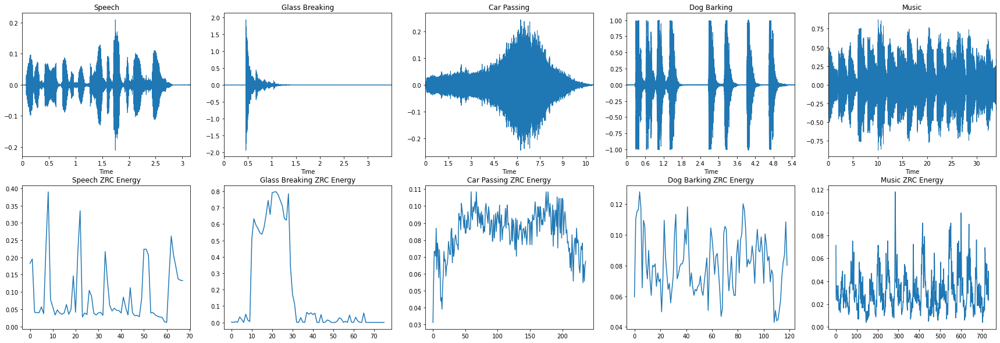

In [37]:
fig, ax = plt.subplots(2,5, figsize=(30,10))

ax[0,0].set(title='Speech')
ax[0,1].set(title='Glass Breaking')
ax[0,2].set(title='Car Passing')
ax[0,3].set(title='Dog Barking')
ax[0,4].set(title='Music')

ax[1,0].set(title='Speech ZRC Energy')
ax[1,1].set(title='Glass Breaking ZRC Energy')
ax[1,2].set(title='Car Passing ZRC Energy')
ax[1,3].set(title='Dog Barking ZRC Energy')
ax[1,4].set(title='Music ZRC Energy')

librosa.display.waveplot(speech, sr=sr_speech, ax=ax[0,0])      #waveplot is used to plot wrt time
librosa.display.waveplot(glass, sr=sr_glass, ax=ax[0,1])
librosa.display.waveplot(car, sr=sr_car, ax=ax[0,2])
librosa.display.waveplot(dog, sr=sr_dog, ax=ax[0,3])
librosa.display.waveplot(music, sr=sr_music, ax=ax[0,4])

ax[1,0].plot(zcr_speech.T)                                      #plot is used and not waveplot because zcr is computed wrt frames(windows) 
ax[1,1].plot(zcr_glass.T)
ax[1,2].plot(zcr_car.T)
ax[1,3].plot(zcr_dog.T)
ax[1,4].plot(zcr_music.T)

### Why .T ?
The return type for `librosa.feature.zero_crossing_rate ` is `np.ndarray [shape=(1, t)]`.But the required shape for plotting is (t, 1) therefore we need to transpose it.

The `.T` property is used to transpose the frame.


In [49]:
print(zcr_speech.shape)
print(zcr_speech.T.shape)

(1, 68)
(68, 1)
